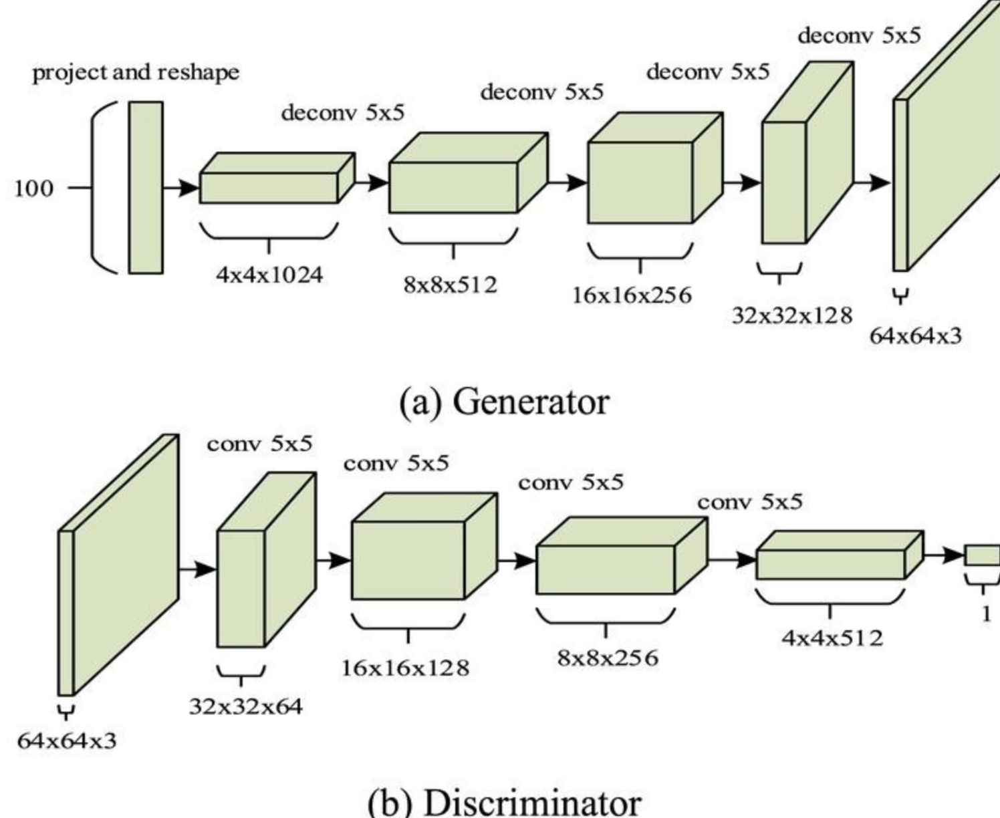

In [1]:
import torch
import torch.nn as nn

## CNN
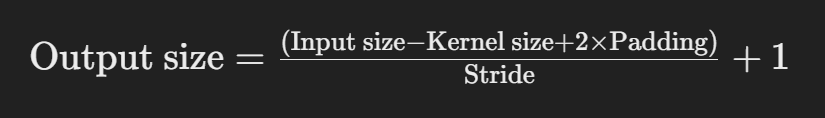

In [2]:
class Discriminator(nn.Module):
  def __init__(self, image_channels, features_first_dim):
    super().__init__()
    #input: batch_size * image_channels * 64 * 64
    self.disc = nn.Sequential(
        nn.Conv2d(image_channels, features_first_dim, kernel_size=4, stride=2, padding=1),
        nn.LeakyReLU(0.2),
        self._block(features_first_dim, features_first_dim * 2, 4, 2, 1),
        self._block(features_first_dim * 2, features_first_dim * 4, 4, 2, 1),
        self._block(features_first_dim * 4, features_first_dim * 8, 4, 2, 1),
        nn.Conv2d(features_first_dim * 8, 1, kernel_size=4, stride=2, padding=0),
        nn.Sigmoid()
    )

  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    return nn.Sequential(
        nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size,
            stride,
            padding,
            bias=False
        ),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2)
    )
  def forward(self, x):
    return self.disc(x)

## Conv Transposed
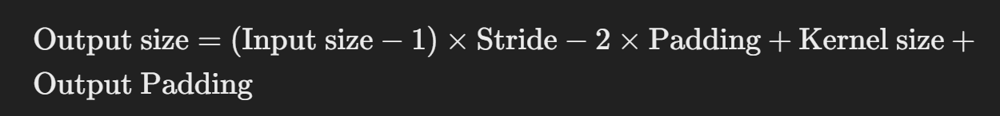

In [3]:
class Generator(nn.Module):
  def __init__(self, noise_dim, image_dim, features_last_dim=64):
    super().__init__()
    #input = B * noise_dim * 1 * 1
    self.gen = nn.Sequential(
        self._block(noise_dim, features_last_dim * 16, 4, 1, 0), # 4 * 4
        self._block(features_last_dim * 16, features_last_dim * 8, 4, 2, 1), #8 * 8
        self._block(features_last_dim * 8, features_last_dim * 4, 4, 2, 1), # 16 * 16
        self._block(features_last_dim * 4, features_last_dim * 2, 4, 2, 1), #32 * 32
        nn.ConvTranspose2d(features_last_dim * 2, image_dim, 4, 2, 1), #64 * 64
        nn.Tanh(), #[-1, 1]
    )

  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    return nn.Sequential(
        nn.ConvTranspose2d(
            in_channels,
            out_channels,
            kernel_size,
            stride,
            padding,
            bias=False
        ),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
        )

  def forward(self, x):
    return self.gen(x)

In [4]:
def initialize_weights(model):
  for m in model.modules():
    if type(m) in [nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d]:
      nn.init.normal_(m.weight.data, 0.0, 0.02)

def test():
  batch_size, img_channels, H, W = 64, 3, 64, 64
  noise_dim = 100
  x = torch.randn((batch_size, img_channels, H, W))
  noise = torch.randn((batch_size, noise_dim, 1, 1))
  gen = Generator(noise_dim, img_channels, 64)
  initialize_weights(gen)
  assert gen(noise).shape == (batch_size, img_channels, H, W)
  print("Success")
  disc = Discriminator(img_channels, 64)
  initialize_weights(disc)
  assert disc(x).shape == (batch_size, 1, 1, 1)
  print("Success")

test()

Success
Success


# Training

In [5]:
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"
LR = 2e-4
BATCH_SIZE = 128
IMAGE_SIZE = 64
IMAGE_DIM = 1
NOISE_DIM = 100
NUM_EPOCHS = 5
FEATURES_DICS = 64
FEATURES_GEN = 64

transforms = transforms.Compose(
    [
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(IMAGE_DIM)], [0.5 for _ in range(IMAGE_DIM)]
        ),
    ]
)
dataset = datasets.MNIST(root="dataset/", transform=transforms, download=True)
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 18187840.21it/s]


Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 486334.43it/s]


Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 3851812.82it/s]


Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 12459469.44it/s]

Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw



In [7]:
gen = Generator(NOISE_DIM, IMAGE_DIM, FEATURES_GEN).to(device)
disc = Discriminator(IMAGE_DIM, FEATURES_DICS).to(device)
initialize_weights(gen)
initialize_weights(disc)

gen_optimizer = optim.Adam(gen.parameters(), lr=LR, betas=(0.5, 0.999))
disc_optimizer = optim.Adam(disc.parameters(), lr=LR, betas=(0.5, 0.999))
criterion = nn.BCELoss()

#when evaluate, just show 32 exaple imgs
fixed_noise = torch.randn(32, NOISE_DIM, 1, 1).to(device)
step = 0
writer_real = SummaryWriter(f"logs/real")
writer_fake = SummaryWriter(f"logs/fake")

In [10]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

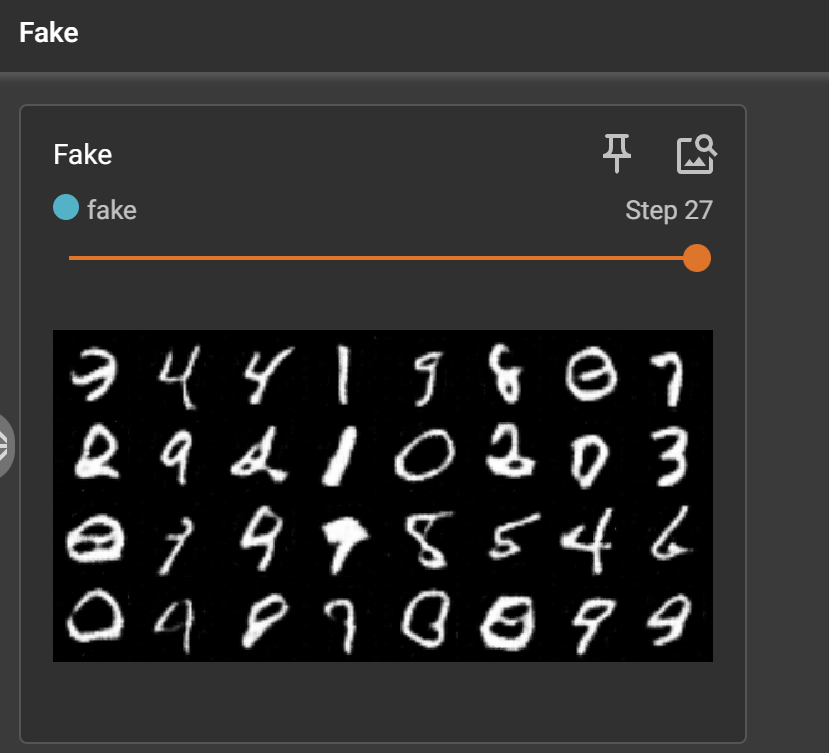

In [11]:
gen.train()
disc.train()
for epoch in range(NUM_EPOCHS):
  for batch_idx, (real, _) in enumerate(loader):
    real = real.to(device)
    batch_size = real.shape[0]
    noise = torch.randn(batch_size, NOISE_DIM, 1, 1).to(device)
    fake = gen(noise)

    #loss dicriminator = max log(D(x)) + log(1 - D(G(z)))
    disc_real = disc(real).reshape(-1)
    disc_fake = disc(fake.detach()).reshape(-1)
    loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
    loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
    loss_disc = (loss_disc_real + loss_disc_fake) / 2
    disc.zero_grad()
    loss_disc.backward()
    disc_optimizer.step()

    #loss generator = max log(D(G(z)))
    output = disc(fake).reshape(-1)
    loss_gen = criterion(output, torch.ones_like(output))
    gen.zero_grad()
    loss_gen.backward()
    gen_optimizer.step()

    if batch_idx % 100 == 0:
      print(
          f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(loader)} \
            Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
      )
      with torch.no_grad():
        fake = gen(fixed_noise)
        img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
        img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
        writer_real.add_image("Real", img_grid_real, global_step=step)
        writer_fake.add_image("Fake", img_grid_fake, global_step=step)
      step += 1

Epoch [0/5] Batch 0/469             Loss D: 0.5480, loss G: 1.1611
Epoch [0/5] Batch 100/469             Loss D: 0.9347, loss G: 1.0441
Epoch [0/5] Batch 200/469             Loss D: 0.6079, loss G: 0.9297
Epoch [0/5] Batch 300/469             Loss D: 0.6087, loss G: 0.7279
Epoch [0/5] Batch 400/469             Loss D: 0.6497, loss G: 1.6207
Epoch [1/5] Batch 0/469             Loss D: 0.5713, loss G: 1.0258
Epoch [1/5] Batch 100/469             Loss D: 0.5282, loss G: 0.8006
Epoch [1/5] Batch 200/469             Loss D: 0.5226, loss G: 1.0724
Epoch [1/5] Batch 300/469             Loss D: 0.4492, loss G: 1.1455
Epoch [1/5] Batch 400/469             Loss D: 0.3678, loss G: 1.6590
Epoch [2/5] Batch 0/469             Loss D: 0.5164, loss G: 0.4984
Epoch [2/5] Batch 100/469             Loss D: 0.3722, loss G: 1.4513
Epoch [2/5] Batch 200/469             Loss D: 0.3576, loss G: 1.5687
Epoch [2/5] Batch 300/469             Loss D: 0.7627, loss G: 0.7328
Epoch [2/5] Batch 400/469             Lo